In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import minimize

plt.rcParams['figure.figsize'] = [16, 8]
plt.rcParams.update({'font.size': 14})
plt.style.use(['dark_background'])

In [3]:
def nmr_detection(X,MHz):
    
    # the amplitude of rf decays as a function 
    # w1(x) = w1(0) * exp( - (x/d) )
    # Signal is proportional to the integral of sin( w1(x) * tp )
    # d=12.1um at 300MHz magnet
    
    d300 = 12.1e-6 # in um 
    d = d300 * 1/np.sqrt(MHz / 300) # skin depth constant in um
    y = np.sin(np.pi/2 * np.exp(-X/d))
    
    return y

def loss_func(ICs):
    
    # define parameters:
    D = 7.11e-15 # self diffusion coefficient
    L = 50e-6 # length of grid (50um)

    dx = L/N
    X = np.arange(0,L-dx,dx)
    tEnd = dt_exp * len(y_exp) # end time [sec]   
    dt = 64 # sec
    T = np.arange(0,tEnd,dt) 
    f_7Li = np.zeros((N + 2,len(T)))
    f_7Li[1:-1,0] = ICs
    f_7Li[[0,-1],0] = [f_7Li[1,0], f_7Li[-2,0]]  
    y_skinEffect = nmr_detection(X,magnet_strength)
    
    # simulation using central differences and forward Euler:
    for j in range(1,len(T)):
        for i in range(1,len(f_7Li)-1):
            dfdt = D * (1 / (dx**2)) * (f_7Li[i+1,j-1] - 2 * f_7Li[i,j-1] + f_7Li[i-1,j-1])
            f_7Li[i,j] = f_7Li[i,j-1] + dt * dfdt
        f_7Li[[0,-1],j] = [f_7Li[1,j], f_7Li[-2,j]] 
    
    # calculate NMR detection:
    f_7Li = f_7Li[1:-1,:] # remove dummy grid cells (1st and last)
    NMR_signal = [np.sum(y_skinEffect * f_7Li[:,j]) for j in range(len(T)) if (j * dt) % 256 == 0]
    NMR_signal = NMR_signal / NMR_signal[0]
    
    # calculate loss (MSE):
    loss = np.mean((y_exp - NMR_signal)**2)
    return loss


In [4]:
# run optimization (LiTFSI dataset)

path = "/Users/David_Columbus/Desktop/LiTFSI fitting ABM/metal_SD.csv"
y_exp = np.genfromtxt(path,delimiter=',',skip_header=1)
dt_exp = 256.0
magnet_strength = 400
N = 50 # Number of discretization points

ICs = np.arange(N,0,-1) / N
bounds = [(0.0,1.0) for i in range(N)]
result = minimize(loss_func, ICs,bounds=bounds,options={"disp":True})

In [5]:
# check Results(LiTFSI dataset):

path = "/Users/David_Columbus/Desktop/LiTFSI fitting ABM/metal_SD.csv"
y_exp = np.genfromtxt(path,delimiter=',',skip_header=1)
dt_exp = 256.0
x_exp = np.arange(0,len(y_exp) * dt_exp, dt_exp)
magnet_strength = 400


# define parameters:

D = 7.11e-15 # self diffusion coefficient
L = 50e-6 # length of grid (50um)
N = 50 # Number of discretization points
dx = L/N
X = np.arange(0,L-dx,dx)
t0 = 0 # starting time [sec]
dt = 32 # step size [sec]
tEnd = dt_exp * len(y_exp) # end time [sec]   
T = np.arange(t0,tEnd,dt) 
f_7Li = np.zeros((N + 2,len(T)))
ICs = result.x
f_7Li[1:-1,0] = ICs
f_7Li[[0,-1],0] = [f_7Li[1,0], f_7Li[-2,0]] # boundary conditions of no flux

# simulation using central differences and forward Euler:

for j in range(1,len(T)):
    for i in range(1,len(f_7Li)-1):
        dfdt = D * (1 / (dx**2)) * (f_7Li[i+1,j-1] - 2 * f_7Li[i,j-1] + f_7Li[i-1,j-1])
        f_7Li[i,j] = f_7Li[i,j-1] + dt * dfdt
    f_7Li[[0,-1],j] = [f_7Li[1,j], f_7Li[-2,j]] 
    
# calculate NMR detection:

y_skinEffect = nmr_detection(X, 400)
f_7Li = f_7Li[1:-1,:] # remove dummy grid cells (1st and last)
NMR_signal = [np.sum(y_skinEffect * f_7Li[:,j]) for j in range(len(T)) if (j * dt) % dt_exp == 0]
NMR_signal = NMR_signal / NMR_signal[0]


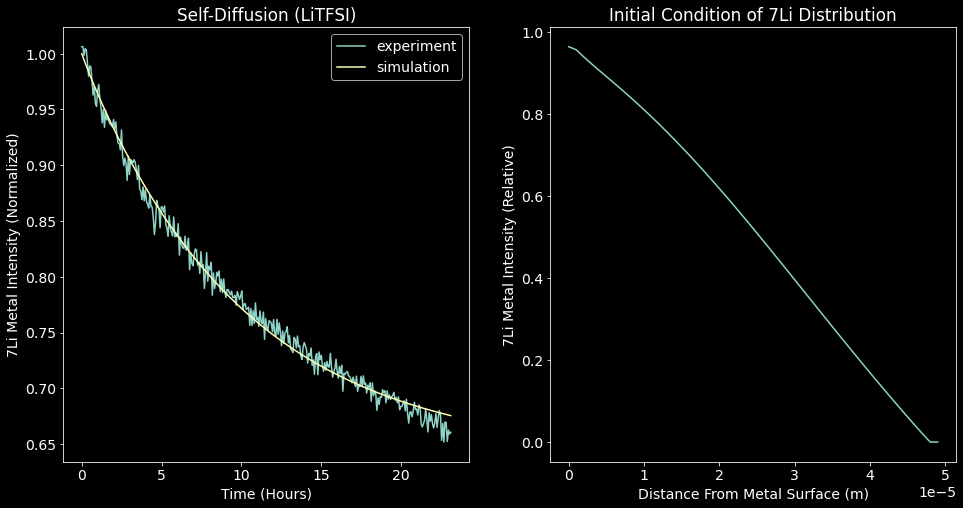

In [6]:
fig = plt.figure()

ax1 = fig.add_subplot(121)
plt.plot(x_exp / 3600 , y_exp)
plt.plot(x_exp / 3600 , NMR_signal)
plt.legend(["experiment", "simulation"],title="")
plt.xlabel("Time (Hours)")
plt.ylabel("7Li Metal Intensity (Normalized)")
plt.title("Self-Diffusion")

ax2 = fig.add_subplot(122)
plt.plot(X,result.x)
plt.xlabel("Distance From Metal Surface (m)")
plt.ylabel("7Li Metal Intensity (Relative)")
plt.title("Initial Condition of 7Li Distribution")

plt.show()

<ipython-input-7-ccf2ebaa5653>:12: MatplotlibDeprecationWarning: Case-insensitive properties were deprecated in 3.3 and support will be removed two minor releases later
  diffusion_plot, = plt.plot([],[],color='r',LineWidth=3)


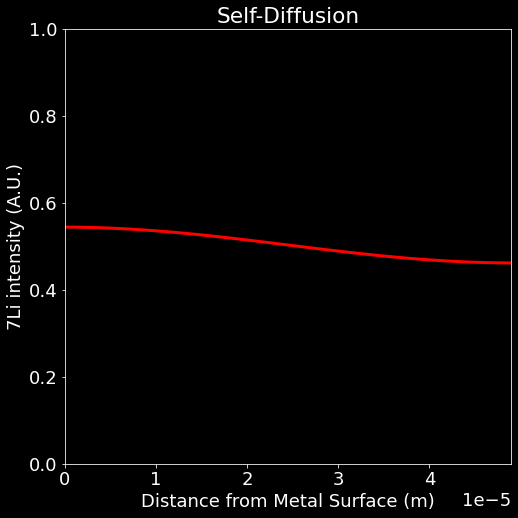

In [7]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
plt.rcParams['figure.figsize'] = [8, 8]
plt.rcParams.update({'font.size': 18})
plt.rcParams['animation.html'] = 'jshtml'

Y = f_7Li[:,np.arange(0,f_7Li.shape[1],10)]

fig,ax = plt.subplots()
diffusion_plot, = plt.plot([],[],color='r',LineWidth=3)
plt.xlabel("Distance from Metal Surface (m)")
plt.ylabel("7Li intensity (A.U.)")
plt.title("Self-Diffusion")
def init():
    ax.set_xlim(X[0],X[-1])
    ax.set_ylim(0, 1)
    return f_7Li

def animate(iter):
    diffusion_plot.set_data(X,Y[:,iter])
    return diffusion_plot

anim = animation.FuncAnimation(fig,animate,init_func=init,frames=260,interval=50,blit=False,repeat=False)
HTML(anim.to_jshtml())